# Lending Club: EDA Case Study

### Lending Club is a marketplace for personal loans that matches borrowers who are seeking a loan with investors looking to lend money and make a return

## Exploratory Data Analysis -- to understand the driving factors behind loan default 

## Importing Necessary Libraries

In [121]:
#Importing libraries
import numpy as np # Math library
import pandas as pd # data processing, CSV file I/O #To work with dataset
import os
import matplotlib.pyplot as plt #to plot some parameters in seaborn
from PIL import  Image 
%matplotlib inline 
import seaborn as sns#Graph library that use matplot in background
import warnings
warnings.filterwarnings("ignore")
import io
import plotly.offline as py#visualization
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go#visualization
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import datetime #Datetime related operations
from datetime import datetime #Datetime related operations

### Data Loading

In [122]:
df = pd.read_csv('loan.csv')

In [123]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


## Data Understanding

In [124]:
data_dict = pd.read_excel('Data_Dictionary.xlsx')
data_dict[['LoanStatNew','Description']].head(5)

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...


In [125]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [126]:
df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


## Data Overview

In [127]:
print ("Rows     : " ,df.shape[0])
print ("Columns  : " ,df.shape[1])
print ("\nFeatures : \n" ,df.columns.tolist())
print ("\nMissing values :  ", df.isnull().sum().values.sum())
print ("\nUnique values :  \n",df.nunique())

Rows     :  39717
Columns  :  111

Features : 
 ['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med', 'mths_since_last_major_derog', 'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'ope

### Data Cleaning - Missing Value Check

In [128]:
#identify null and non null attriutes
list_NA =[]
for i in df.columns:
    if df[i].isnull().sum() == 39717:
        list_NA.append(i)

print(list_NA)


['mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq', 'percent_bc_gt_75', 'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit', 'total_il_high_credit_

In [129]:
#drop these Not Available columns, as the entire column is not available for all the rows and hence no use in eda.
for i in list_NA:
    df.drop([i], axis =1,inplace=True)
#print(df.head(2))

In [130]:
# find the % of null values in each columns
round(100*(df.isnull().sum()/len(df)),2)

id                             0.00
member_id                      0.00
loan_amnt                      0.00
funded_amnt                    0.00
funded_amnt_inv                0.00
term                           0.00
int_rate                       0.00
installment                    0.00
grade                          0.00
sub_grade                      0.00
emp_title                      6.19
emp_length                     2.71
home_ownership                 0.00
annual_inc                     0.00
verification_status            0.00
issue_d                        0.00
loan_status                    0.00
pymnt_plan                     0.00
url                            0.00
desc                          32.58
purpose                        0.00
title                          0.03
zip_code                       0.00
addr_state                     0.00
dti                            0.00
delinq_2yrs                    0.00
earliest_cr_line               0.00
inq_last_6mths              

In [131]:
#Drop "next_pymnt_d" column as ~97% of its values is NULL.
df.drop(['next_pymnt_d'],axis=1, inplace=True)
print(df.shape)

(39717, 56)


In [132]:
#Drop "mths_since_last_record" column as ~93% of its values is NULL.
df.drop(['mths_since_last_record'],axis=1, inplace=True)
print(df.shape)

(39717, 55)


## Data Cleaning based on Data understanding

In [133]:
list_cust_behaviour_variables = pd.read_csv('Loan behaviour variables.csv')
print(list_cust_behaviour_variables.columns)

Index(['delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'application_type'],
      dtype='object')


In [134]:
#The customer behavior variables are not available at the time of loan application, and thus they cannot be used as predictors for credit approval.
#hence droping ,as these variables cant be used by Lending Club agent for new applcants.

print(df.shape)
for i in list_cust_behaviour_variables.columns:
    df.drop([i], axis =1,inplace=True)
print(df.shape)

(39717, 55)
(39717, 34)


In [17]:
#identify only 1 value'attriutes. The attributes having only single value , will not make any differnence or influence any analysis.
#Hence dropping such attributes
list_only_one_value =[]
for i in df.columns:
    if df[i].nunique() == 1:
        list_only_one_value.append(i)

print(list_only_one_value)

['pymnt_plan', 'initial_list_status', 'collections_12_mths_ex_med', 'policy_code', 'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt', 'tax_liens']


In [18]:
print(df.shape)
for i in list_only_one_value:
    df.drop([i],axis =1, inplace = True)
    
print(df.shape)

(38577, 34)
(38577, 26)


###  Filter data based on Data understanding Cont..

In [143]:
print("before dropping current records:\n\n" ,df.loan_status.value_counts())
#drop the rows which has "Current" loan status, as the anlaysis on these rows will not be applicable to identify if the new applicant will be charged-off or not.
df = df[df.loan_status != 'Current']
print("\nafter dropping current records:\n\n" ,df.loan_status.value_counts())

before dropping current records:

 Fully Paid     32950
Charged Off     5627
Name: loan_status, dtype: int64

after dropping current records:

 Fully Paid     32950
Charged Off     5627
Name: loan_status, dtype: int64



## Data Cleaning - Fix Invalid Values

In [146]:
#Fix invalid int_rate by removing % and converting into float
df.int_rate = df.int_rate.apply(lambda x : float(x.replace('%','')))

In [147]:
#fix the datatype to datetime for issue_d variable
df.issue_d = df.issue_d.apply(lambda x:datetime.strptime(x,'%b-%y'))

TypeError: strptime() argument 1 must be str, not Timestamp

## Standardising Values and Derived variables

In [148]:
#derive issue_d into issue_d_month and issue_d_year 
df['issue_d_year'], df['issue_d_month'] = df['issue_d'].dt.year, df['issue_d'].dt.month

In [149]:
# standardizing term to have only month number
df["term_mon"] = df.term.apply(lambda x : int(x[1:3]))

In [150]:
#standardizing employee length as per data dictionary
df["emp_length_std_derived"] = df.emp_length.apply(lambda x : 0 if x=='< 1 year' else(1 if x=='10+ years' else 2))

In [154]:
#Deriving new employee length with all the values in the files 
print(df.shape)
df["emp_length_in_years"] = df["emp_length"]
print(df.shape)
print(df.emp_length_in_years.isnull().sum())
df["emp_length_in_years"].fillna(-1, inplace=True)
print(df.shape)
df['emp_length_in_years'] = df.emp_length_in_years.apply(lambda x : 0 if x== '< 1 year' else (10 if x == '10+ years' else (-1 if x==-1 else (1 if x== '1 year' else int(str(x).replace(' years',''))))))
print(df.emp_length_in_years.value_counts())

(38577, 39)
(38577, 39)
1033
(38577, 39)
 10    8488
 0     4508
 2     4291
 3     4012
 4     3342
 5     3194
 1     3169
 6     2168
 7     1711
 8     1435
 9     1226
-1     1033
Name: emp_length_in_years, dtype: int64


In [155]:
#Bucketting the Annual income to use in data Analysis
df['Inc_bucket'] = df.annual_inc.apply(lambda x : '500K+' if x > 500000 else ('300K+' if x > 300000 else ('150K+' if x > 150000 else ('100K+' if x > 100000 else ('50K+' if x>50000 else ('20K+' if x>20000 else '0-20K')))))) 
#df['Inc_bucket'] = df.annual_inc.apply(lambda x : '1M +' if x > 1000000 else ('500K+' if x > 500000 else ('450K+' if x > 450000 else ('300K+' if x > 300000 else ('150K+' if x > 150000 else '0-150K'))))) 
df.Inc_bucket.value_counts()

50K+     17707
20K+     14209
100K+     3995
150K+     1315
0-20K     1180
300K+      105
500K+       66
Name: Inc_bucket, dtype: int64

In [29]:
#Bucketting the Annual income to use in data Analysis
df['Inc_bucket_in_K'] = df.annual_inc.apply(lambda x : '500' if x > 500000 else ('300' if x > 300000 else ('150' if x > 150000 else ('100' if x > 100000 else ('50' if x>50000 else ('20' if x>20000 else '0')))))) 
defaulters = df[df['loan_status'] == 'Charged Off']
not_defaulters = df[df['loan_status'] != 'Charged Off']
print(defaulters.shape)
print(not_defaulters.shape)
print(df.shape)

(5627, 33)
(32950, 33)
(38577, 33)


## Identify Outlier 

In [30]:
print ("Rows     : " ,df.shape[0])
print ("Columns  : " ,df.shape[1])
print ("\nFeatures : \n" ,df.columns.tolist())
print ("\nMissing values :  ", df.isnull().sum().values.sum())
print ("\nUnique values :  \n",df.nunique())

Rows     :  38577
Columns  :  33

Features : 
 ['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'url', 'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'mths_since_last_delinq', 'pub_rec_bankruptcies', 'issue_d_year', 'issue_d_month', 'term_mon', 'emp_length_std_derived', 'emp_length_in_years', 'Inc_bucket', 'Inc_bucket_in_K']

Missing values :   41559

Unique values :  
 id                        38577
member_id                 38577
loan_amnt                   870
funded_amnt                1019
funded_amnt_inv            8050
term                          2
int_rate                    370
installment               15022
grade                         7
sub_grade                    35
emp_title                 28027
emp_length                   11
home_ownership                5
annual_inc    

In [157]:
cat_cols = ['Inc_bucket_in_K','emp_length_in_years','purpose','term','term_mon','issue_d_year','issue_d_month','grade','sub_grade','emp_length','emp_length_std_derived','home_ownership','verification_status','issue_d_month','issue_d_year','addr_state','pub_rec_bankruptcies']
cont_cols = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv','int_rate', 'installment','annual_inc','dti']

loan_amnt


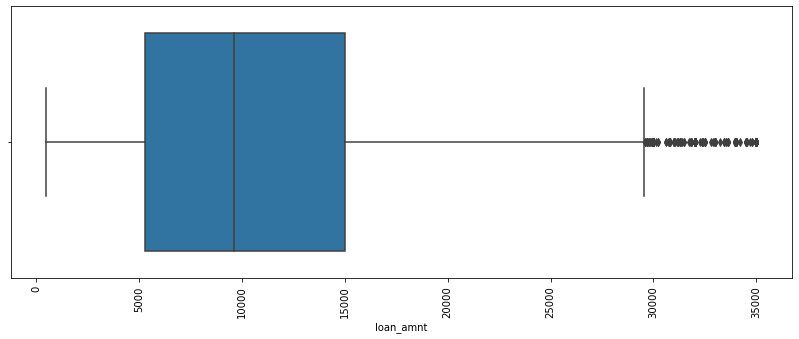

funded_amnt


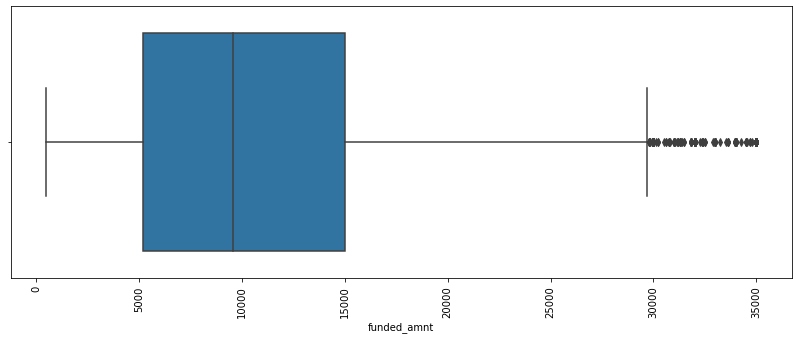

funded_amnt_inv


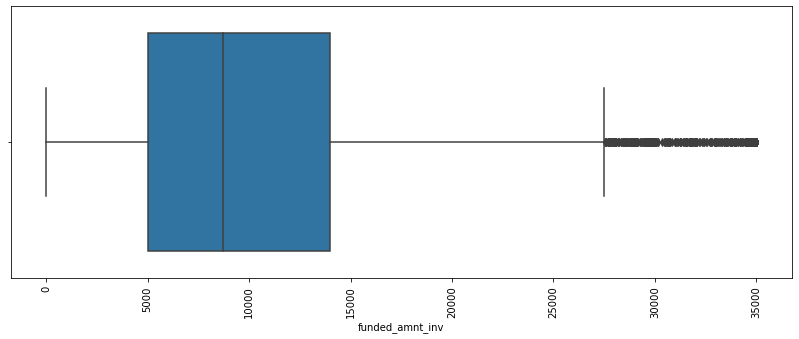

int_rate


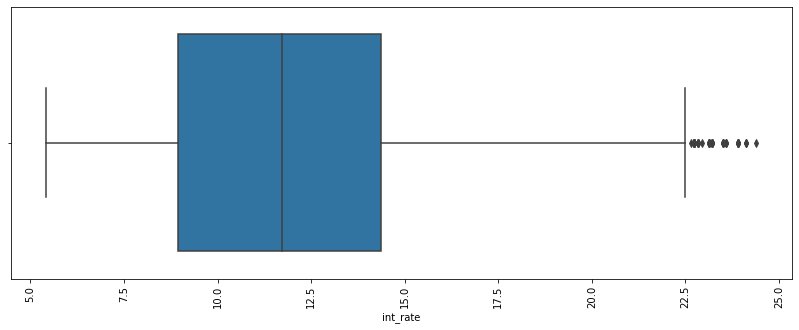

installment


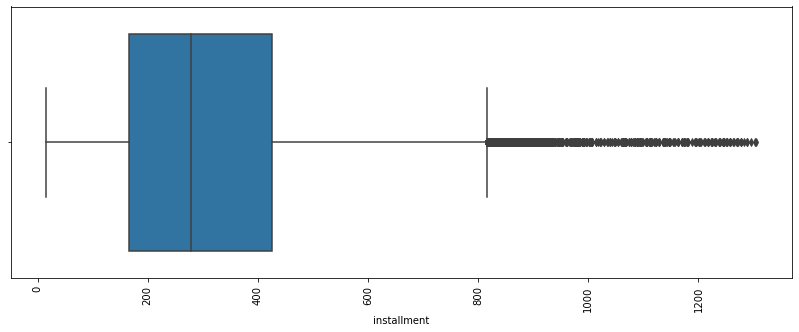

annual_inc


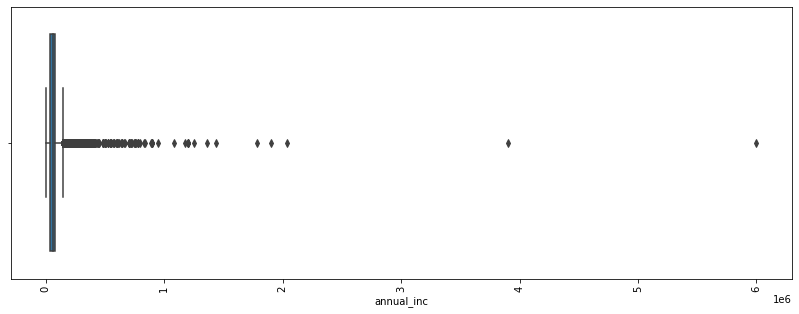

dti


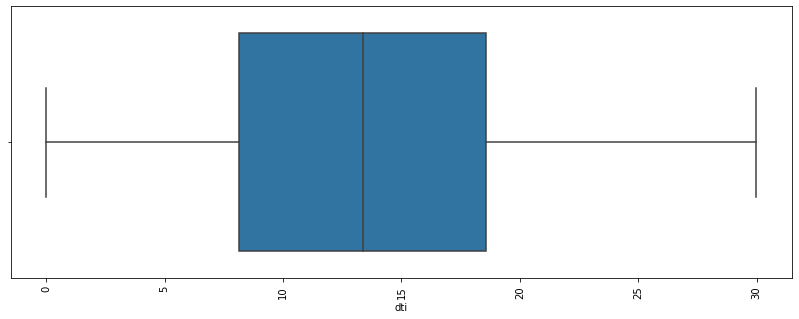

In [158]:
#Box plots to identify outliers
for i in cont_cols:
    print(i)
    plt.figure(figsize=([14,5]))
    sns.boxplot(df[i])
    plt.xticks(rotation=90)
    plt.show()

## Annual income has very high ranging outlier, hence CAPPING annual income into a new derived column for further data analysis 

count    3.857700e+04
mean     6.877797e+04
std      6.421868e+04
min      4.000000e+03
25%      4.000000e+04
50%      5.886800e+04
75%      8.200000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64
count     38577.000000
mean      65044.917784
std       32652.937415
min        4000.000000
25%       40000.000000
50%       58868.000000
75%       82000.000000
max      145000.000000
Name: annual_inc_capped, dtype: float64


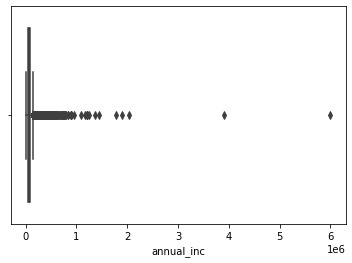

In [159]:
sns.boxplot(df.annual_inc)
print(df.annual_inc.describe())
q1=40000
q3=82000
iqr = q3-q1
ub=q3+1.5*iqr
lb=q1-1.5*iqr
df['annual_inc_capped'] = np.where(df['annual_inc']>ub,ub,df['annual_inc'])
print(df.annual_inc_capped.describe())

<AxesSubplot:xlabel='annual_inc_capped'>

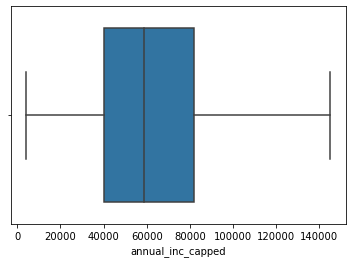

In [160]:
sns.boxplot(df.annual_inc_capped)

## Segmentation of column

In [161]:
cat_cols = ['Inc_bucket_in_K','emp_length_in_years','purpose','term','term_mon','issue_d_year','issue_d_month','grade','sub_grade','emp_length','emp_length_std_derived','home_ownership','verification_status','issue_d_month','issue_d_year','addr_state','pub_rec_bankruptcies']
cont_cols = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv','int_rate', 'installment','annual_inc','annual_inc_capped','dti']

In [162]:
print(cat_cols,cont_cols)

['Inc_bucket_in_K', 'emp_length_in_years', 'purpose', 'term', 'term_mon', 'issue_d_year', 'issue_d_month', 'grade', 'sub_grade', 'emp_length', 'emp_length_std_derived', 'home_ownership', 'verification_status', 'issue_d_month', 'issue_d_year', 'addr_state', 'pub_rec_bankruptcies'] ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment', 'annual_inc', 'annual_inc_capped', 'dti']


# DATA ANALYSIS

## Univariate Analysis

## Univariate of categorical columns

Inc_bucket_in_K


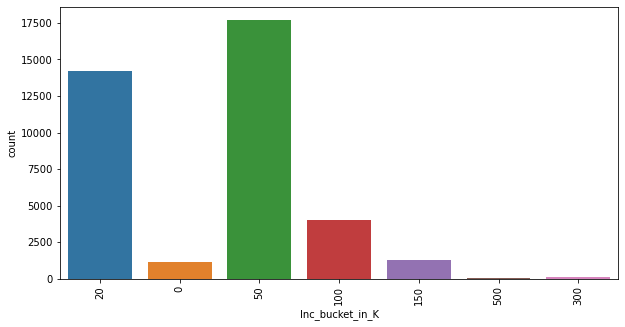

emp_length_in_years


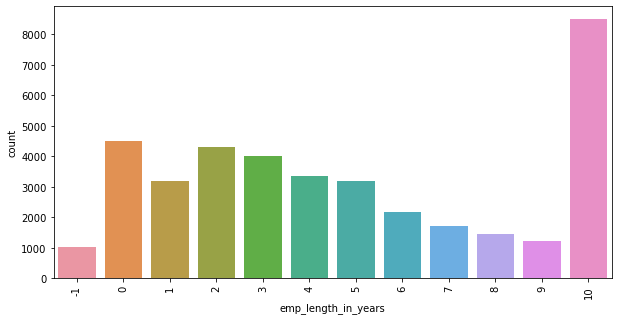

purpose


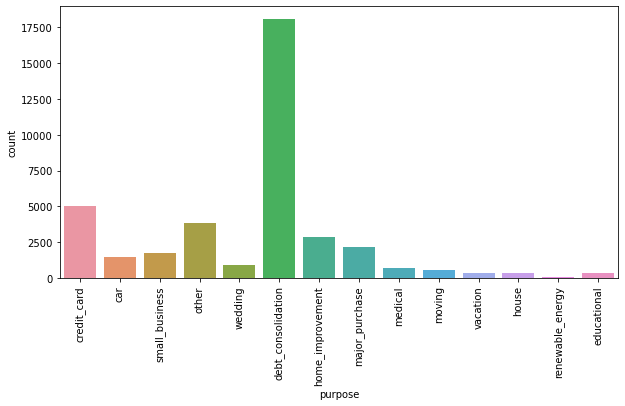

term


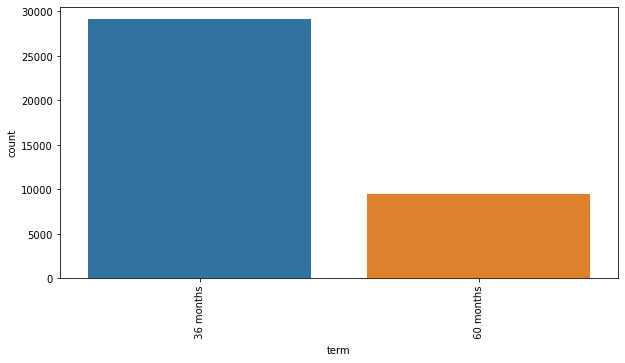

term_mon


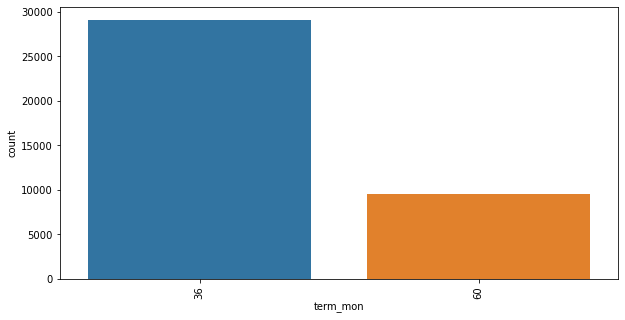

issue_d_year


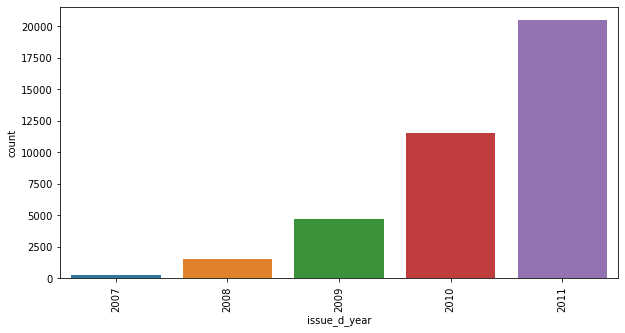

issue_d_month


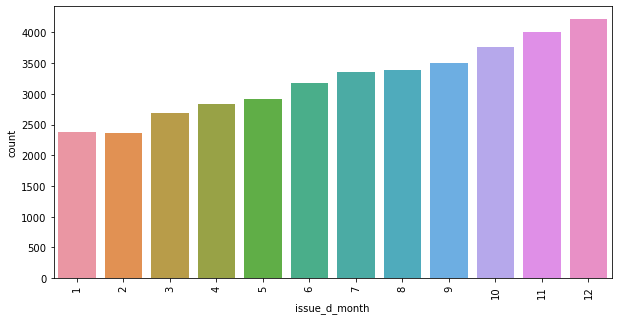

grade


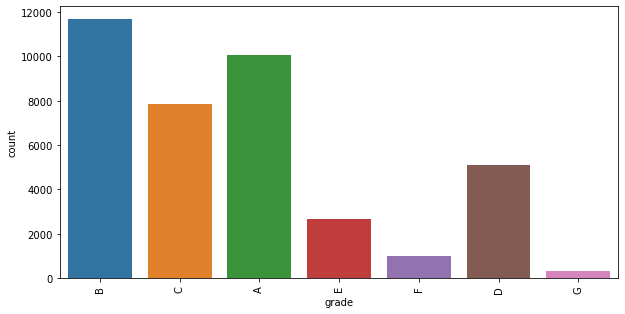

sub_grade


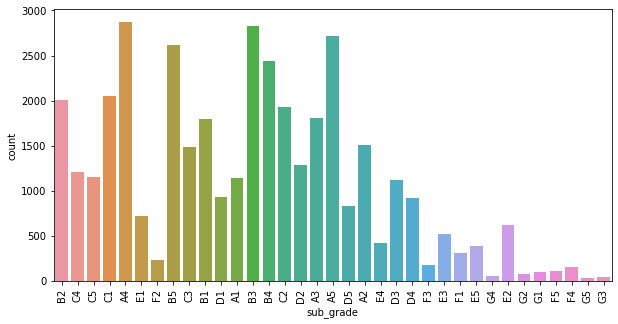

emp_length


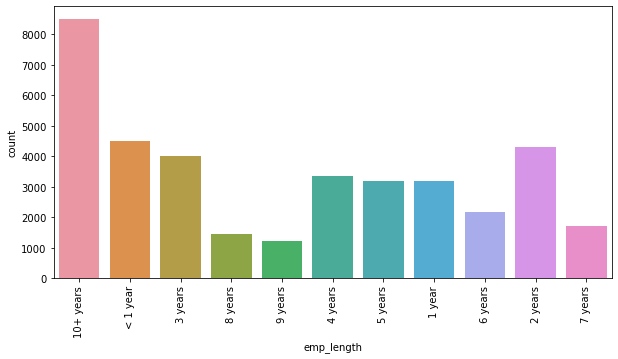

emp_length_std_derived


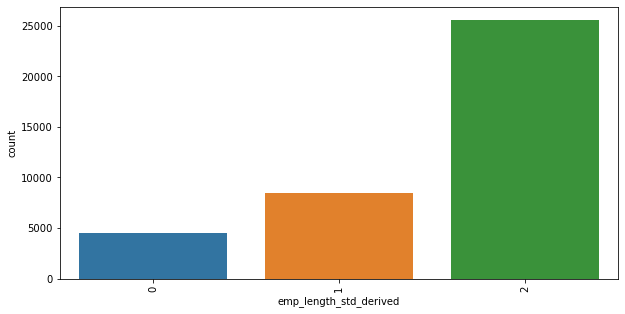

home_ownership


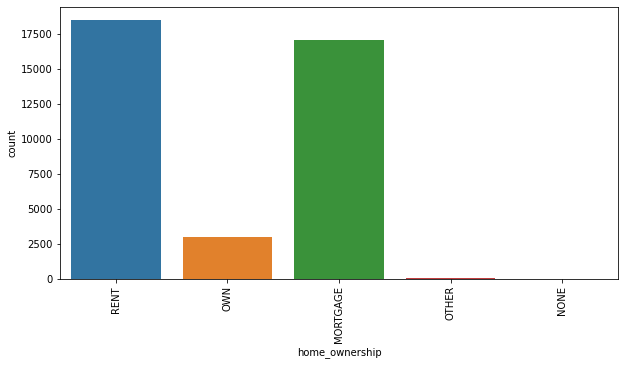

verification_status


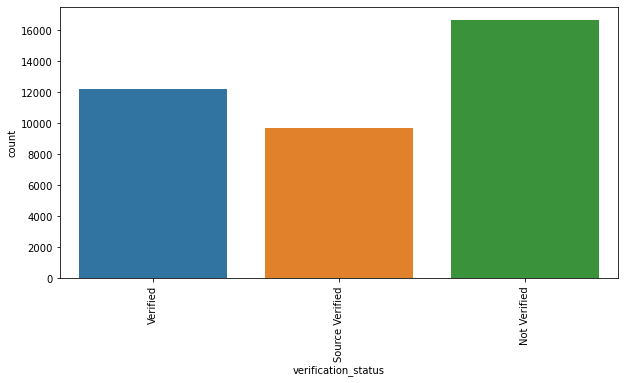

issue_d_month


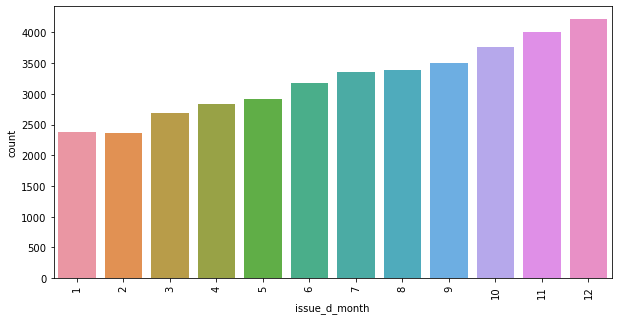

issue_d_year


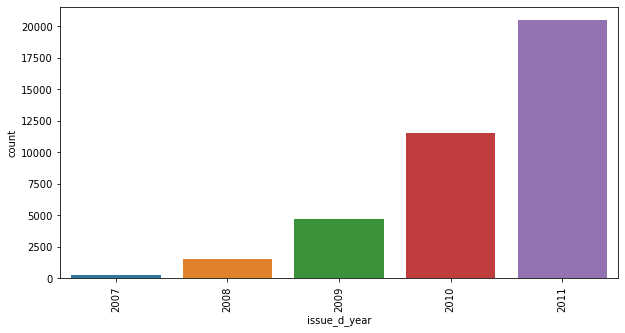

addr_state


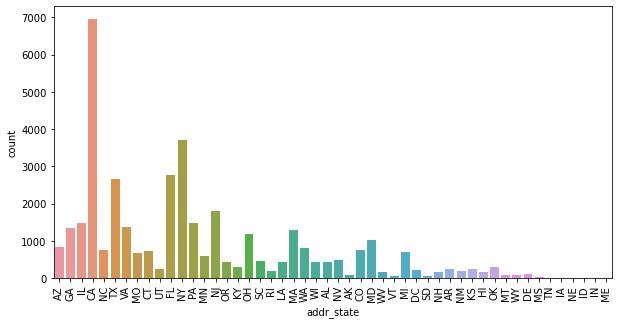

pub_rec_bankruptcies


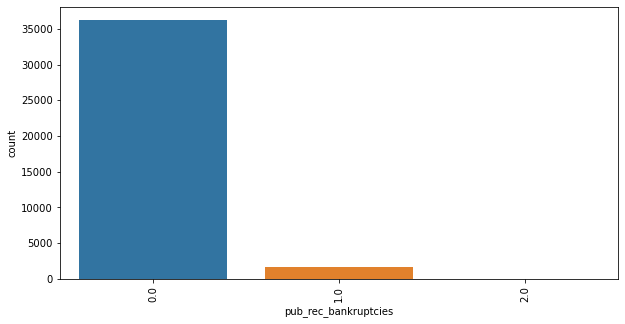

In [37]:
for i in cat_cols:
    print(i)
    plt.figure(figsize=([10,5]))
    sns.countplot(df[i])
    plt.xticks(rotation=90)
    plt.show()

### Insights:
    1. Number of applicants increase from 2007 to 2011
    2. frequency of loans are more with 10+years of employee length
    3. Frequency of loans are most in grade B
    4. Most Number of aplicants prefer 36 months loan term
    5. Most of customers applying for the loan fall under thier anual income buckt of 50-100K

## Bivariate Analysis

## Analysis of all the continous variable wrt to Loan status [defaulter or not]

loan_amnt


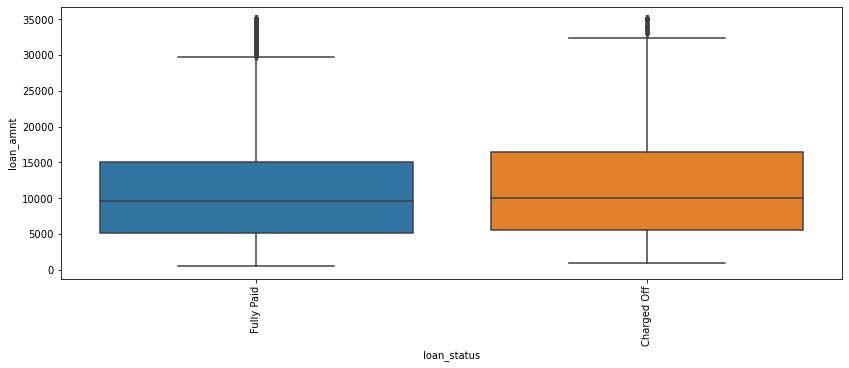

funded_amnt


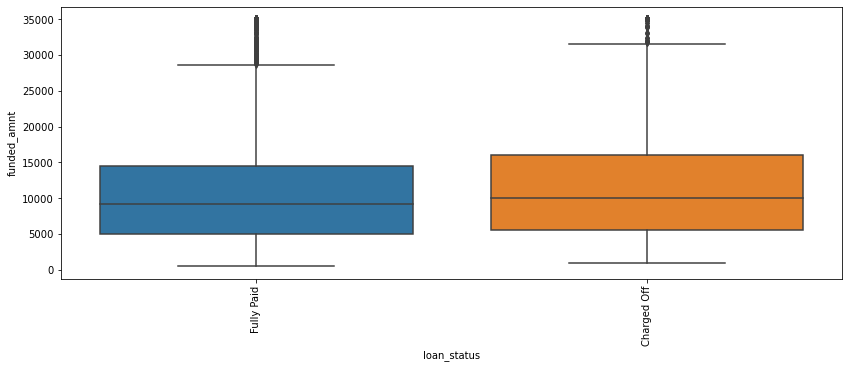

funded_amnt_inv


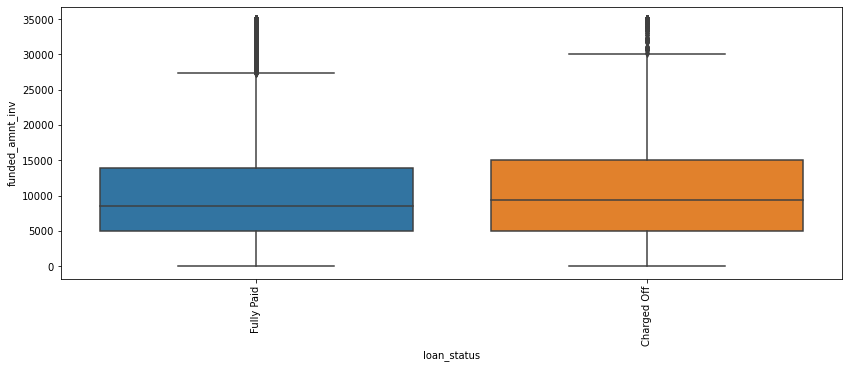

int_rate


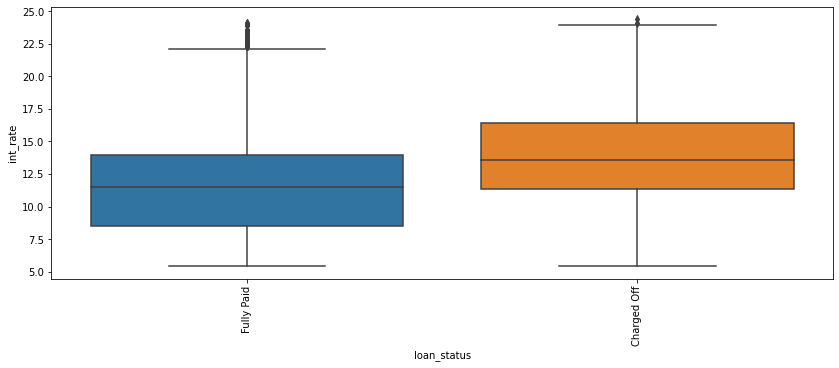

installment


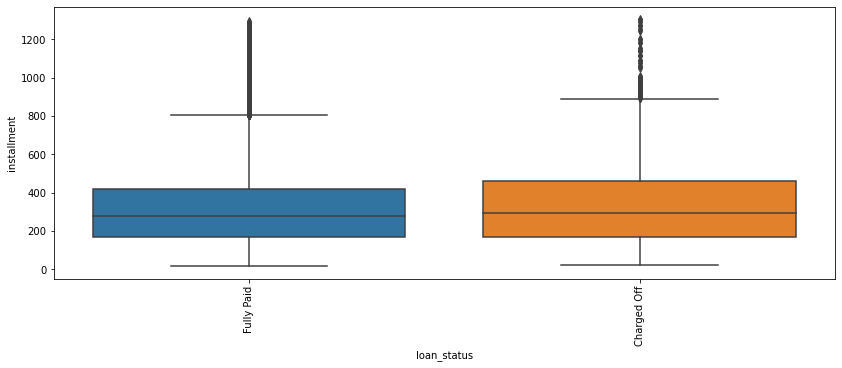

annual_inc


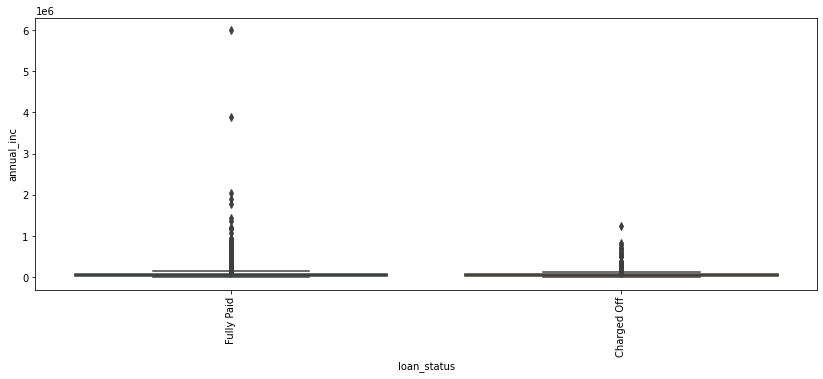

dti


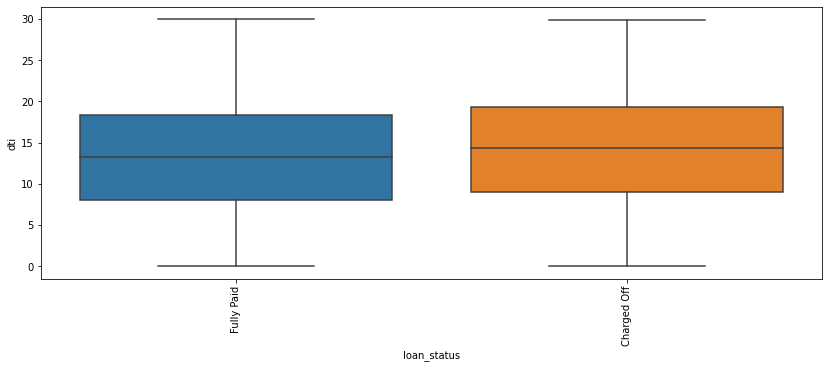

In [41]:
#checking the distribution of continous variables for defaulters and non defaulters
for i in cont_cols:
    print(i)
    plt.figure(figsize=([14,5]))
    sns.boxplot(data= df, x='loan_status',y=i)
    plt.xticks(rotation=90)
    plt.show()

loan_amnt


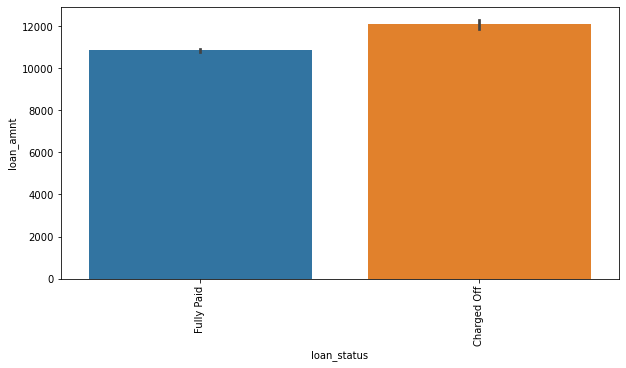

funded_amnt


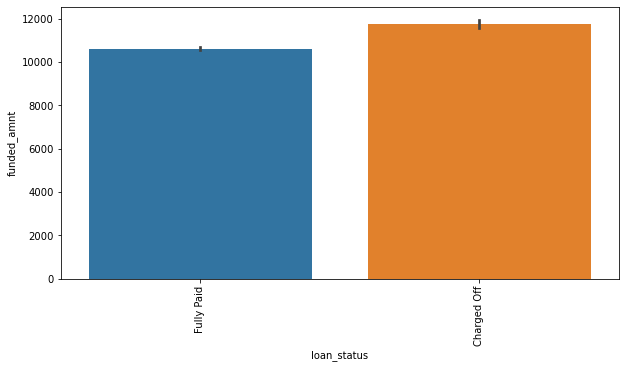

funded_amnt_inv


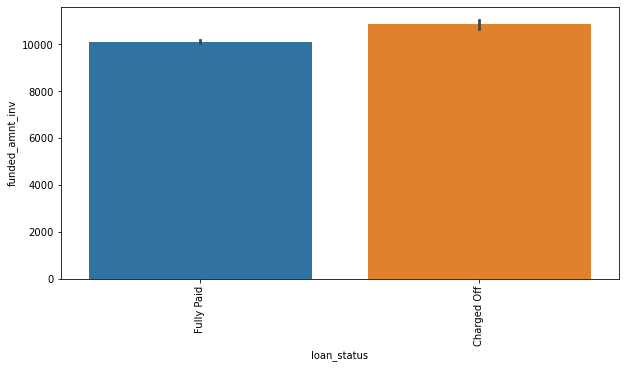

int_rate


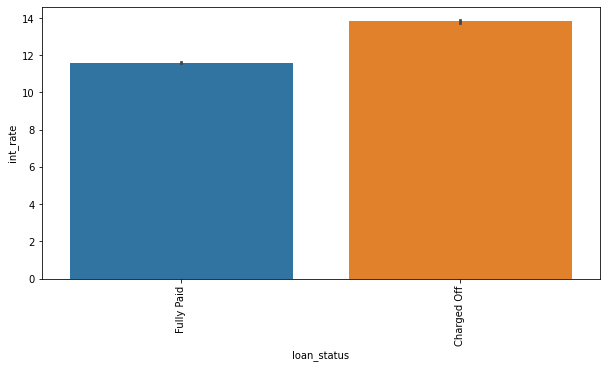

installment


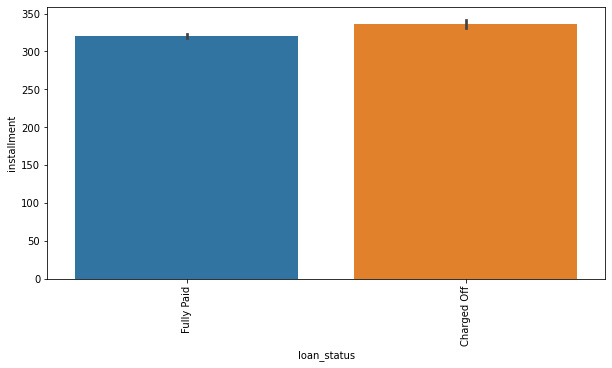

annual_inc


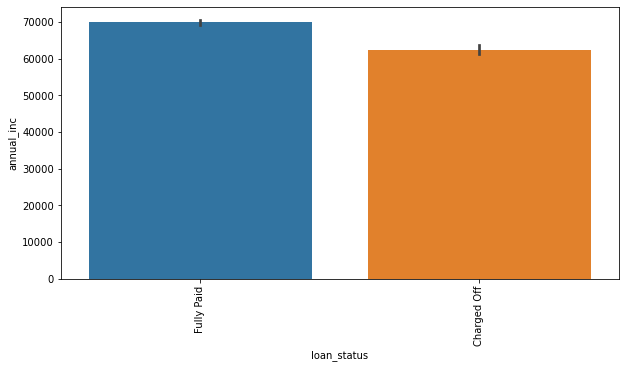

dti


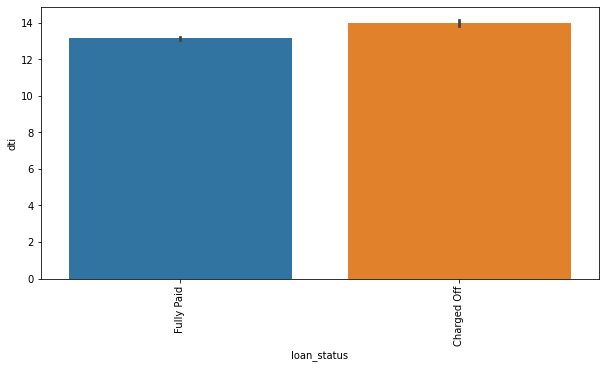

In [42]:
#Comparing the continous variables values wrt defaulters and non defaulters
for i in cont_cols:
    print(i)
    plt.figure(figsize=([10,5]))
    sns.barplot(data= df, x='loan_status',y=i)
    plt.xticks(rotation=90)
    plt.show()

## Insights:
    1. The Loan amount, installments , interst rates, dti is observed to be more in defaulters than full paid customers
    2. annual income of the defauters is noticed to be lower than full paid customers


# Analysis of defaulters and non defaulters wrt Grades

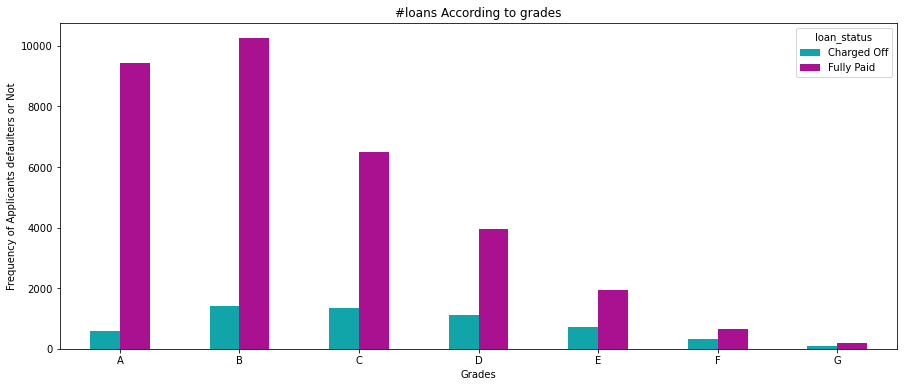

In [44]:
pd.crosstab(df.grade,df.loan_status).plot(kind="bar",figsize=(15,6),color=['#11A5AA','#AA1190' ])
plt.title('#loans According to grades')
plt.xlabel('Grades')
plt.xticks(rotation = 0)
plt.ylabel('Frequency of Applicants defaulters or Not')
plt.show()

## Insights: th defaulters are gradually decreasing as the grade goes higher from grade B to G.

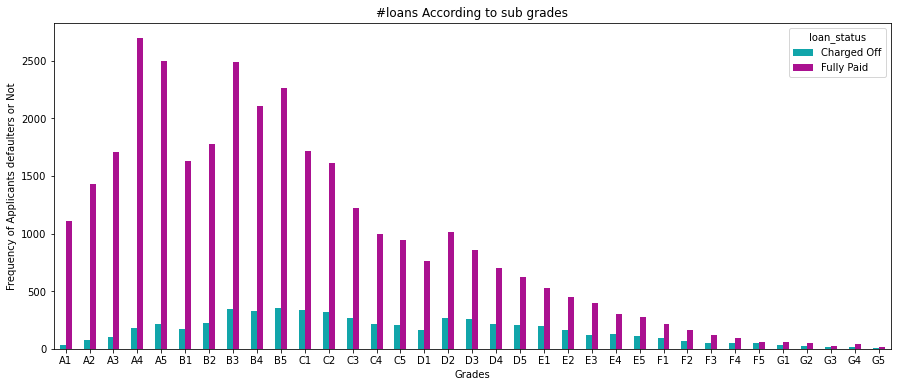

In [168]:
# Analysis of sub grades vs loan status
pd.crosstab(df.sub_grade,df.loan_status).plot(kind="bar",figsize=(15,6),color=['#11A5AA','#AA1190' ])
plt.title('#loans According to sub grades')
plt.xlabel('Grades')
plt.xticks(rotation = 0)
plt.ylabel('Frequency of Applicants defaulters or Not')
plt.show()

## Insight: Similar observation of gradual decrease in defaulters count from grade B to G

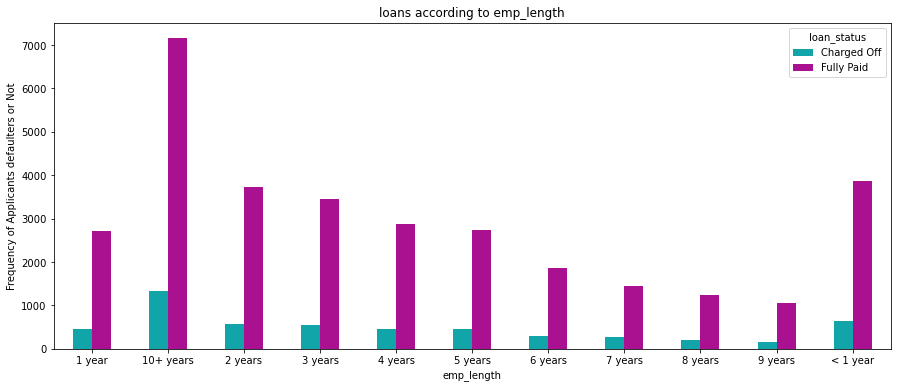

In [170]:
# Analysis of employee length vs loan status

pd.crosstab(df.emp_length,df.loan_status).plot(kind="bar",figsize=(15,6),color=['#11A5AA','#AA1190' ])
plt.title('loans according to emp_length')
plt.xlabel('emp_length')
plt.xticks(rotation = 0)
plt.ylabel('Frequency of Applicants defaulters or Not')
plt.show()

## Insights :
    1. As the employee's years of working experience increases, defaulters tend to decrease, hence more the employee length, its more likely that applicant will be non-defaulter

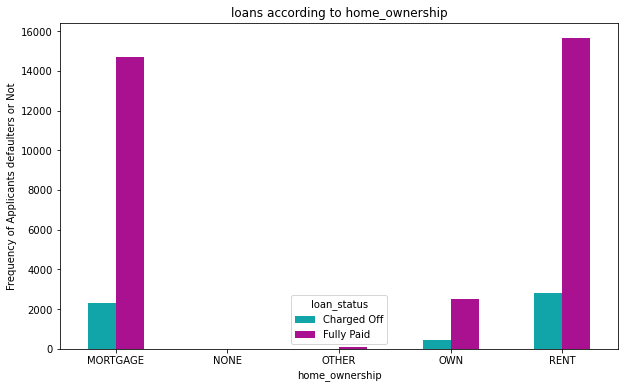

In [47]:
# Analysis of loan status wrt home ownership
pd.crosstab(df.home_ownership,df.loan_status).plot(kind="bar",figsize=(10,6),color=['#11A5AA','#AA1190' ])
plt.title('loans according to home_ownership')
plt.xlabel('home_ownership')
plt.xticks(rotation = 0)
plt.ylabel('Frequency of Applicants defaulters or Not')
plt.show()

Insights :¶
1. Applicants are less likely to be defaulters , if he/she owns a house! 

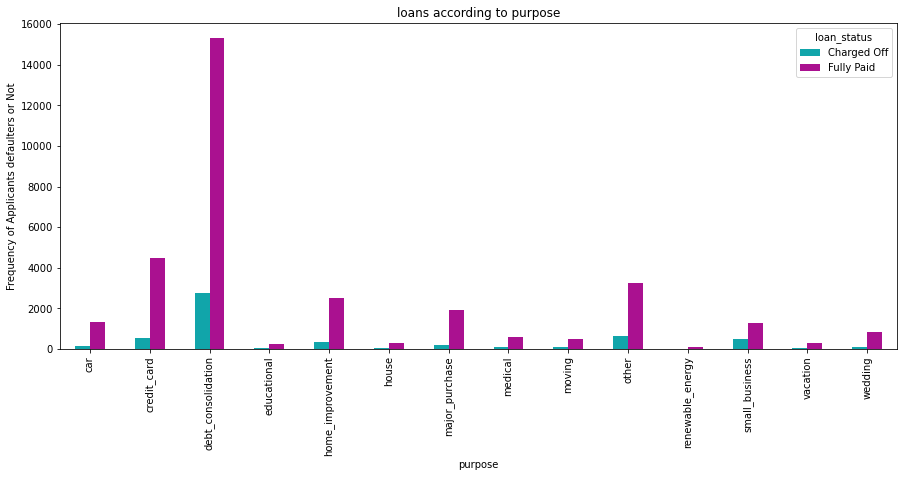

In [54]:
pd.crosstab(df.purpose,df.loan_status).plot(kind="bar",figsize=(15,6),color=['#11A5AA','#AA1190' ])
plt.title('loans according to purpose')
plt.xlabel('purpose')
plt.xticks(rotation = 90)
plt.ylabel('Frequency of Applicants defaulters or Not')
plt.show()

In [57]:
#function  for pie plot for customer attrition types
def plot_pie(column) :
    
    trace1 = go.Pie(values  = defaulters[column].value_counts().values.tolist(),
                    labels  = defaulters[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [0,.48]),
                    name    = "Lending Club Borrowers/Applicants who are charged Off",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    hole    = .6
                   )
    trace2 = go.Pie(values  = not_defaulters[column].value_counts().values.tolist(),
                    labels  = not_defaulters[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    domain  = dict(x = [.52,1]),
                    hole    = .6,
                    name    = "Lending Club Borrowers/Applicants who have Paid Fully" 
                   )


    layout = go.Layout(dict(title = column + " distribution in customer attrition ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            annotations = [dict(text = "Charged Off customers",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .15, y = .5),
                                           dict(text = "Paid Fully customers",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .88,y = .5
                                               )
                                          ]
                           )
                      )
    data = [trace1,trace2]
    fig  = go.Figure(data = data,layout = layout)
    py.iplot(fig)

#for all categorical columns plot pie
for i in cat_cols :
    plot_pie(i)


In [58]:
tr0 = go.Box(
    y=not_defaulters["loan_amnt"],
    x=not_defaulters["grade"],
    name='Fully paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=defaulters['loan_amnt'],
    x=defaulters['grade'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Loan Amount(US Dollar)',
        zeroline=False
    ),
    xaxis=dict(
        title='grades'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-grade-cat')

## Insight  - Loan applicants who fall under grade G -are mostly going to be non-defaulters even when loan amount reuested is high

In [59]:
tr0 = go.Box(
    y=not_defaulters["loan_amnt"],
    x=not_defaulters["Inc_bucket"],
    name='Fully paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=defaulters['loan_amnt'],
    x=defaulters['Inc_bucket'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Loan Amount(US Dollar)',
        zeroline=False
    ),
    xaxis=dict(
        title='Annual_income_buckets'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-grade-cat')

## Insights-
    1.The applicants have annual income between 50K to 150K are more likely to be defauters when thier Loan amount requested is higher than 7K.
    2.Also we can notice that Borrowers whose income in 300K+ are most likely to be non defaulters even though the loan amount requested is higher, adding more value to business

In [60]:
tr0 = go.Box(
    y=not_defaulters["dti"],
    x=not_defaulters["Inc_bucket"],
    name='Fully paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=defaulters['dti'],
    x=defaulters['Inc_bucket'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='DTI ratio monthly debt payments vs monthly income',
        zeroline=False
    ),
    xaxis=dict(
        title='Annual_income_buckets'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-grade-cat')

## Insights-
    1.Applicants whose DTI is lower ranging from [0-8.5] and thier annual income is 500K+ are likely to be defaulted.
    2.More the annual income but thier DTI ratio is lesser , they are more likely to be defaulters

In [61]:
tr0 = go.Box(
    y=not_defaulters["loan_amnt"],
    x=not_defaulters["purpose"],
    name='Fully paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=defaulters['loan_amnt'],
    x=defaulters['purpose'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Loan Amount(US Dollar)',
        zeroline=False
    ),
    xaxis=dict(
        title='purpose of loan'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-prupose-cat')

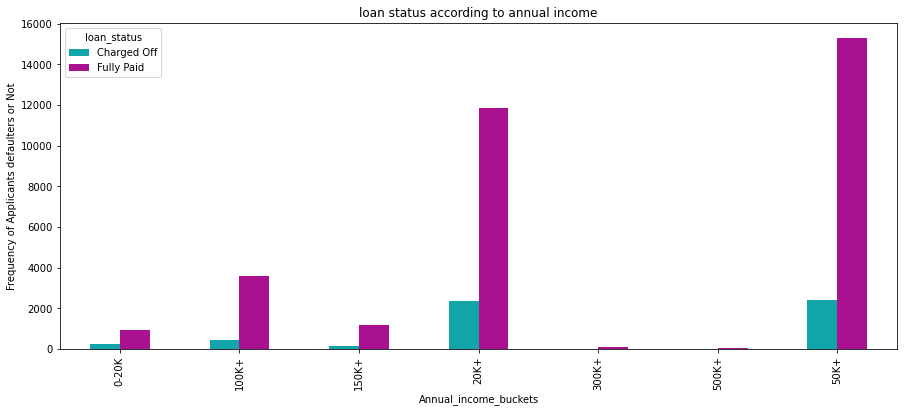

In [71]:
pd.crosstab(df.Inc_bucket,df.loan_status).plot(kind="bar",figsize=(15,6),color=['#11A5AA','#AA1190' ])
plt.title('loan status according to annual income')
plt.xlabel('Annual_income_buckets')
plt.xticks(rotation = 90)
plt.ylabel('Frequency of Applicants defaulters or Not')
plt.show()

# home_ownership vs Loan_amt for fully paid and charged off customers

In [72]:
tr0 = go.Box(
    y=not_defaulters["loan_amnt"],
    x=not_defaulters["home_ownership"],
    name='Fully paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=defaulters['loan_amnt'],
    x=defaulters['home_ownership'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Loan Amount(US Dollar)',
        zeroline=False
    ),
    xaxis=dict(
        title='home_ownership'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-home_ownership-cat')

## insight -Loan applicants who has Mortgage property is tend to be defaulter when higher loan amount is requested 

In [171]:
cont_cols

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'annual_inc_capped',
 'dti']

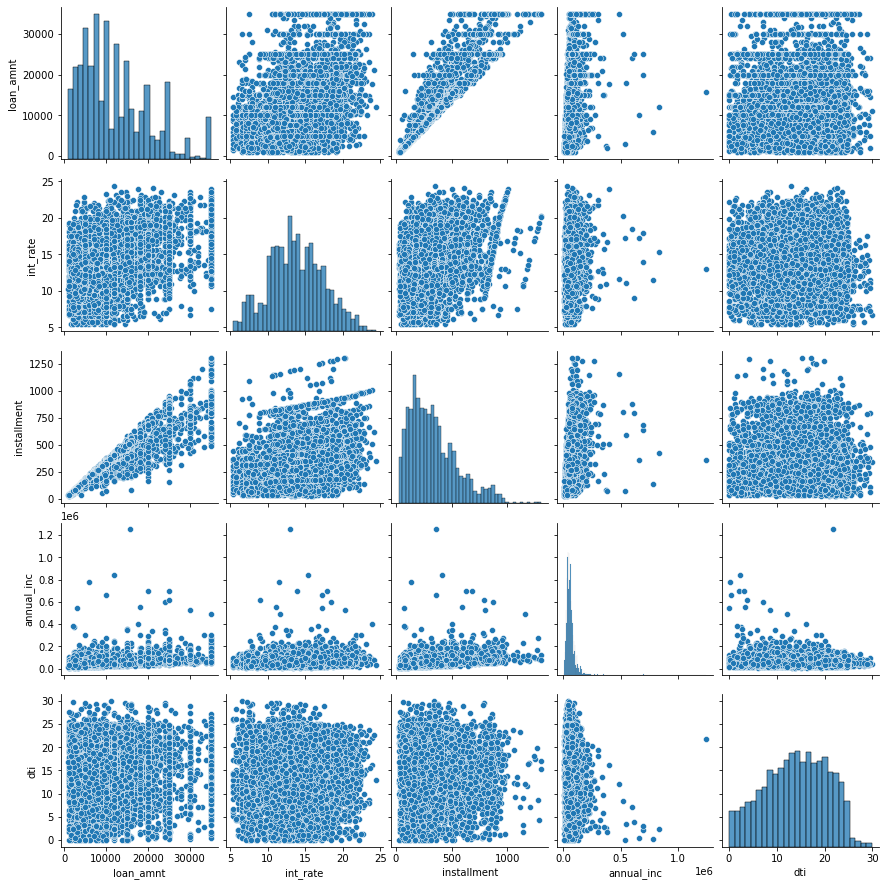

In [76]:
sns.pairplot(defaulters[['loan_amnt','int_rate','installment','annual_inc','dti']])
plt.show()

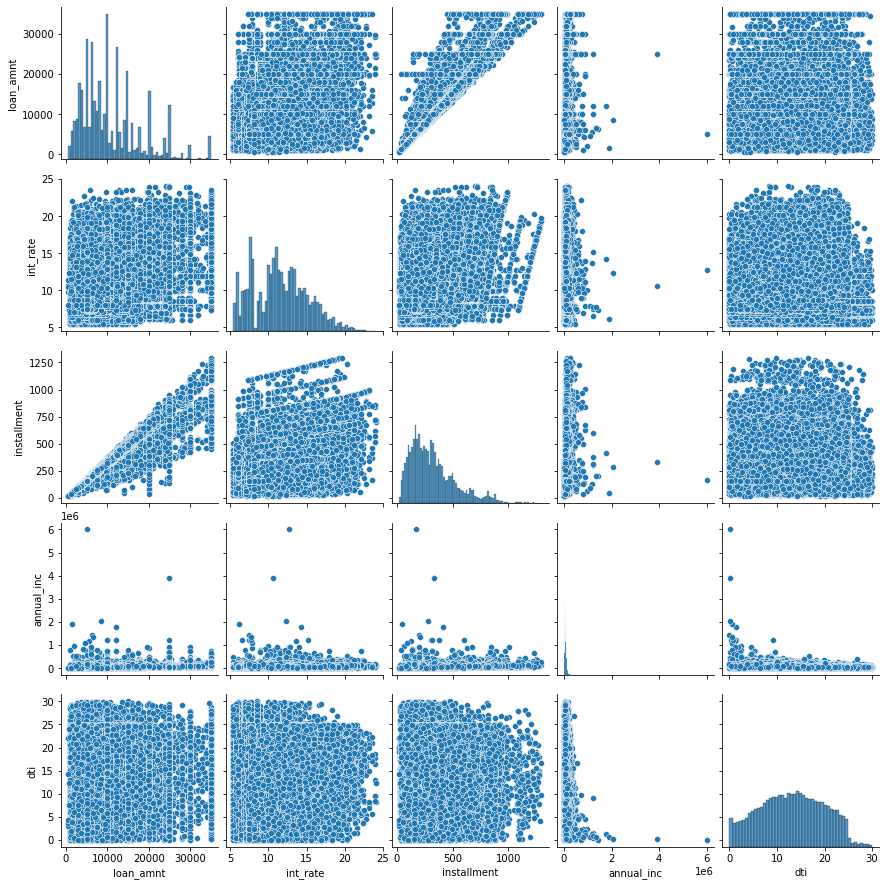

In [77]:
sns.pairplot(not_defaulters[['loan_amnt','int_rate','installment','annual_inc','dti']])
plt.show()

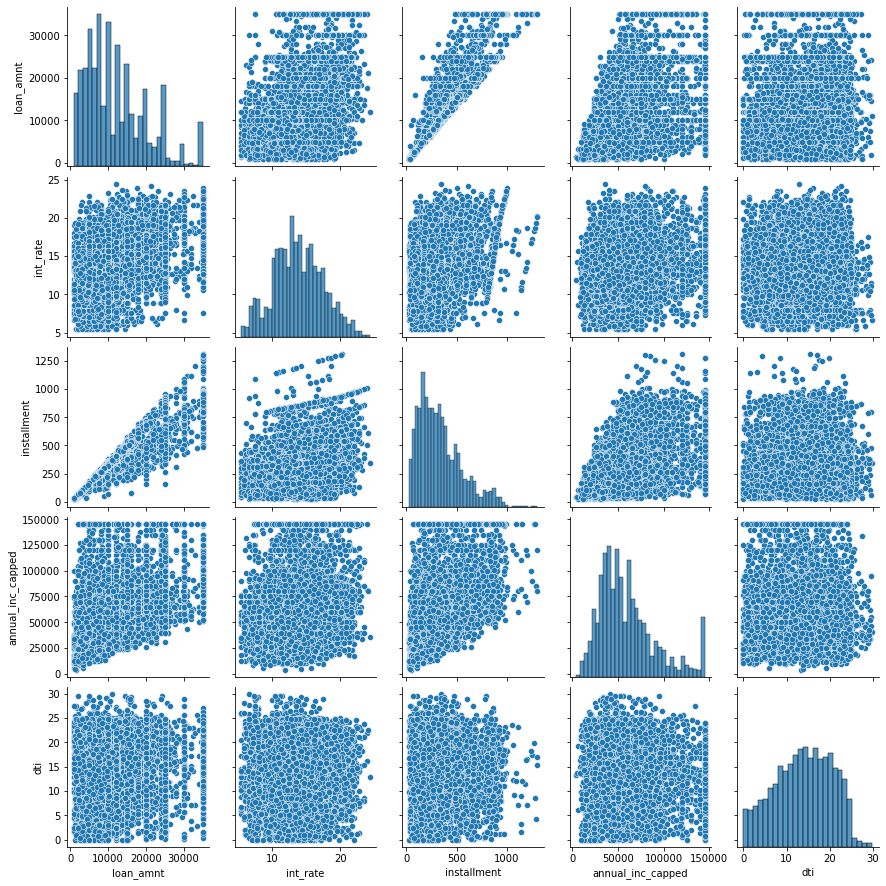

In [78]:
sns.pairplot(defaulters[['loan_amnt','int_rate','installment','annual_inc_capped','dti']])
plt.show()

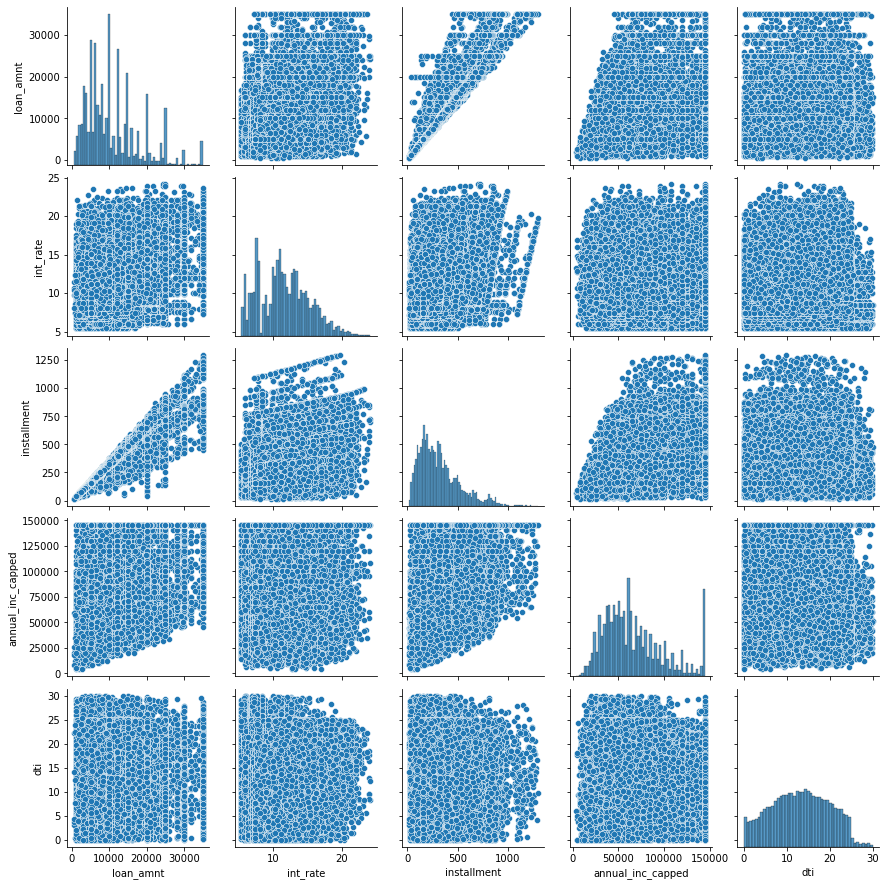

In [79]:
sns.pairplot(not_defaulters[['loan_amnt','int_rate','installment','annual_inc_capped','dti']])
plt.show()

In [89]:
tr0 = go.Box(
    y=not_defaulters["int_rate"],
    x=not_defaulters["purpose"],
    name='Fully paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=defaulters['int_rate'],
    x=defaulters['purpose'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='int_rate (%)',
        zeroline=False
    ),
    xaxis=dict(
        title='purpose of loan'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-prupose-cat')

 ## Insights-
 
 ## Generally if the interest rates are higher than usual for a particular purpose of loan, its more likely that , applicant will be a defaulter

## We can also see drastic charged off applicants when interest rates are high around 15%[median] for Housing loan, 
## Similar trend observed for debt_consolidation as well

In [90]:
cont_cols

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'dti']

In [91]:
#Distribuition of Defaulters/non defaulters by Housing
fig = {
    "data": [
        {
            "type": 'violin',
            "x": not_defaulters['home_ownership'],
            "y": not_defaulters['dti'],
            "legendgroup": 'Fully paid',
            "scalegroup": 'No',
            "name": 'Fully Paid',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'blue'
            }
        },
        {
            "type": 'violin',
            "x": defaulters['home_ownership'],
            "y": defaulters['dti'],
            "legendgroup": 'Defaulters',
            "scalegroup": 'No',
            "name": 'Defaulters',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'violin/split', validate = False)

In [92]:
#Distribuition of Defaulters/non defaulters by Grades
fig = {
    "data": [
        {
            "type": 'violin',
            "x": not_defaulters['grade'],
            "y": not_defaulters['int_rate'],
            "legendgroup": 'Fully paid',
            "scalegroup": 'No',
            "name": 'Fully Paid',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'blue'
            }
        },
        {
            "type": 'violin',
            "x": defaulters['grade'],
            "y": defaulters['int_rate'],
            "legendgroup": 'Defaulters',
            "scalegroup": 'No',
            "name": 'Defaulters',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'violin/split', validate = False)

## Insight - Interst rates grows linearly with grade from A to G.


## Conclusions

1. Customer who apply for 36 months term most likely to pay in full so we can avoid customer ask for 60 months 
2. Loan applicants who fall under grade G -are mostly going to be non-defaulters even when loan amount reuested is high
3.  The applicants have annual income between 50K to 150K are more likely to be defauters when thier Loan amount requested is higher than 7K
4. Also we can notice that Borrowers whose income in 300K+ are most likely to be non defaulters even though the loan amount requested is higher, adding more value to business
5. Applicants whose DTI is lower ranging from [0-8.5] and thier annual income is 500K+ are likely to be defaulted.
6. More the annual income but thier DTI ratio is lesser , they are more likely to be defaulters
7. Customer asking loan for debt repayment of credit card payemt are most likely to get default
8. Loan applicants who has Mortgage property is tend to be defaulter when higher loan amount is requested 
9. Customer provided housing loan on a higher interest rate(around 15%) are most likely to be charged off. Generally, if interest rates are higher than usual for a particular purpose of loan, its more likely that, applicant will be a defaulter
Similar trend observed for debt consolidation as well
10. Interest rates grows linearly with grade from A to G.